This Step teaches us how to load validation and testing data for keras.

# 1. Mobile-Net Model

In [8]:
#Step 1
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image

# === USER VARIABLES ===

# Path to your dataset folder organized by class subfolders
#DATASET_DIR = 'dataset/'  # Change to your dataset path
#DATASET_DIR = '/content/drive/MyDrive/2026_Teaching/ST1/Week_7_Tut_Lab_Activities/Assets/insects_dataset/train_data/'
DATASET_DIR = './insects_dataset/'
# Image input size and batch size for training
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 123  # For deterministic shuffling/splitting

# === STEP 1: Load dataset and split into train/validation ===

print("Loading dataset with 80/20 train-validation split...")
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Classes found: {class_names}")




Loading dataset with 80/20 train-validation split...
Found 2664 files belonging to 2 classes.


Using 2132 files for training.
Found 2664 files belonging to 2 classes.
Using 532 files for validation.
Classes found: ['test_data', 'train_data']


This Step optimises the dataset for performance.

In [9]:
# === STEP 2: Optimize dataset performance ===

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

This step randomly flips, rotates and zooms in the images. It then shows us some of them. 

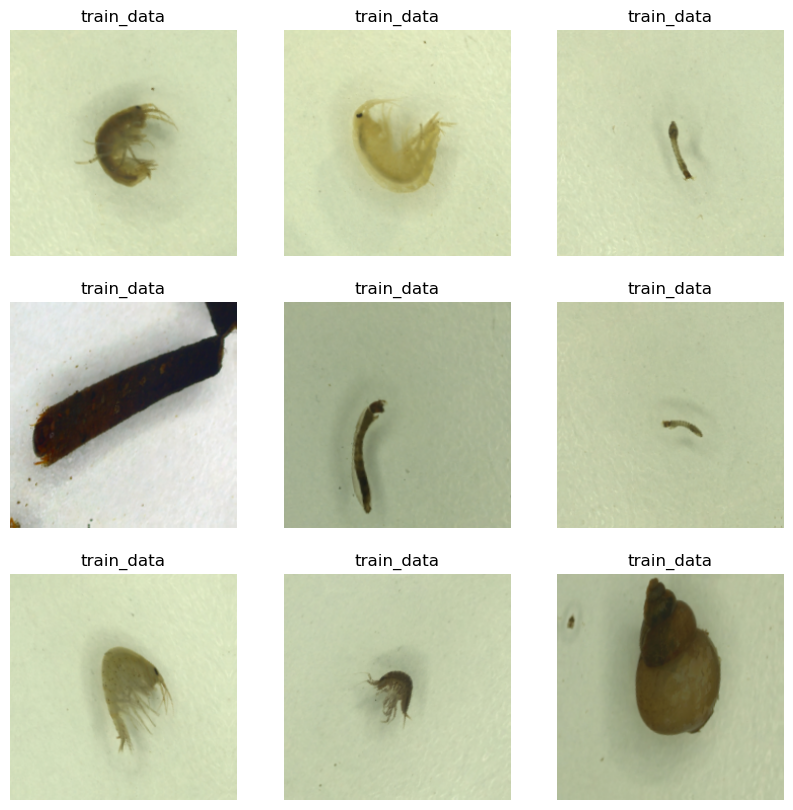

In [10]:
# === STEP 3: Data augmentation (recommended) ===

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Visualize some augmented images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    augmented_images = data_augmentation(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

This Step compiles a model and has a certain amount of trainable and non-trainable parameters.

In [11]:
# === STEP 4: Build transfer learning model ===

base_model = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False  # Freeze the base model initially

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)
x = tf.keras.applications.mobilenet_v2.preprocess_input(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │         2,562 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,260,546 (8.62 MB)

 Trainable params: 2,562 (10.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

This step trains the model.

In [12]:

# === STEP 5: Train the model ===

EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 25s 335ms/step - accuracy: 0.9756 - loss: 0.0843 - val_accuracy: 0.9906 - val_loss: 0.0733
Epoch 2/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 308ms/step - accuracy: 0.9953 - loss: 0.0303 - val_accuracy: 0.9906 - val_loss: 0.0521
Epoch 3/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 308ms/step - accuracy: 0.9953 - loss: 0.0268 - val_accuracy: 0.9906 - val_loss: 0.0449
Epoch 4/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 314ms/step - accuracy: 0.9953 - loss: 0.0265 - val_accuracy: 0.9906 - val_loss: 0.0409
Epoch 5/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 309ms/step - accuracy: 0.9958 - loss: 0.0240 - val_accuracy: 0.9906 - val_loss: 0.0413
Epoch 6/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 22s 322ms/step - accuracy: 0.9953 - loss: 0.0216 - val_accuracy: 0.9906 - val_loss: 0.0415
Epoch 7/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 22s 323ms/step - accuracy: 0.9958 - loss: 0.0200 - val_accuracy: 0.9906 - val_loss: 0.0356
Epoch 8/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 313ms/step - accuracy: 0.9953 - loss: 0.0181 - val_accu

This step shows us the accuracy of the validation and training data and how much we lost from both of them. 

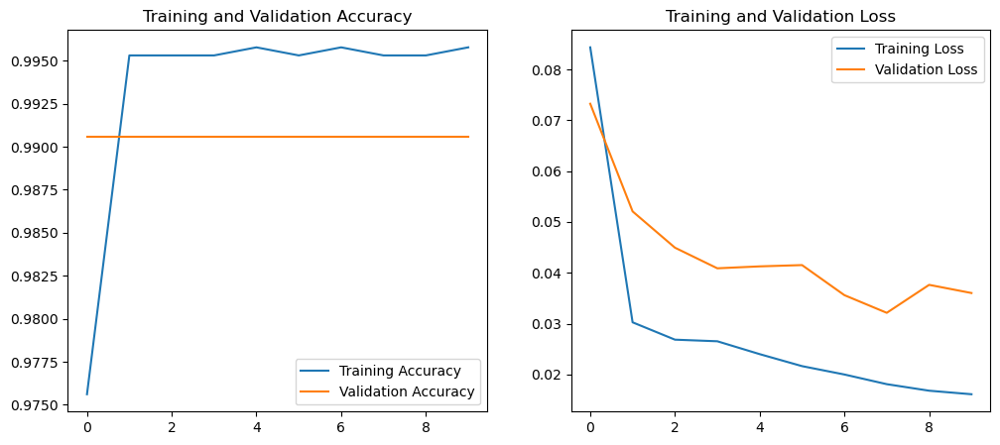

In [13]:
# === STEP 6: Plot training curves ===

# Re-extracting from history to ensure correct length for initial EPOCHS
initial_acc = history.history['accuracy']
initial_val_acc = history.history['val_accuracy']
initial_loss = history.history['loss']
initial_val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, initial_acc, label='Training Accuracy')
plt.plot(epochs_range, initial_val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, initial_loss, label='Training Loss')
plt.plot(epochs_range, initial_val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

This step checks how accurate our validation dataset was.

In [14]:
# === STEP 7: Evaluate on validation set ===

val_loss, val_acc = model.evaluate(val_ds)
print(f'Validation accuracy: {val_acc*100:.2f}%')

17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9906 - loss: 0.0360
Validation accuracy: 99.06%


This step saves the model we've just trained.

In [15]:
# === STEP 9: Save the trained model ===
#%cd /content/drive/MyDrive/2026_Teaching/ST1/Week_7_Tut_Lab_Activities
model.save('macroinvertebrates_classifier.h5')
print("Model saved as 'macroinvertebrates_classifier.h5'")

Model saved as 'macroinvertebrates_classifier.h5'


This step shows us the confusion matrix, how weighted the precision, recall and f1-score was, as well as the fact that the test_data slowly increased its true positive rate over time until the end where it jumped up to 100%.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step


<Figure size 1200x1200 with 0 Axes>

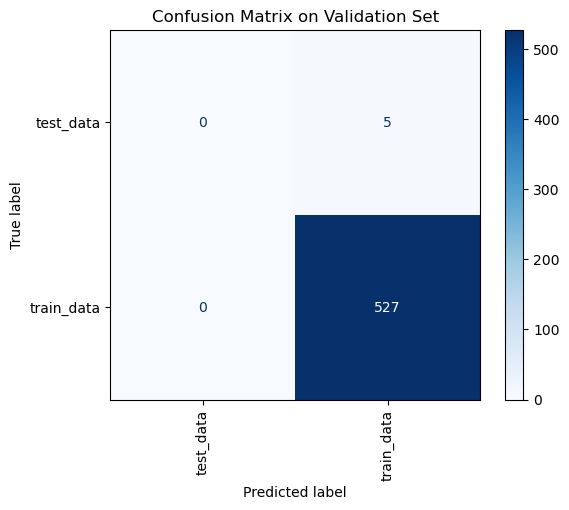

Weighted Precision: 0.9813
Weighted Recall:    0.9906
Weighted F1-score:  0.9859


/nix/store/vi9ql32cvmhq73h8zn05lab3pz3c7fsd-python3-3.13.12-env/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


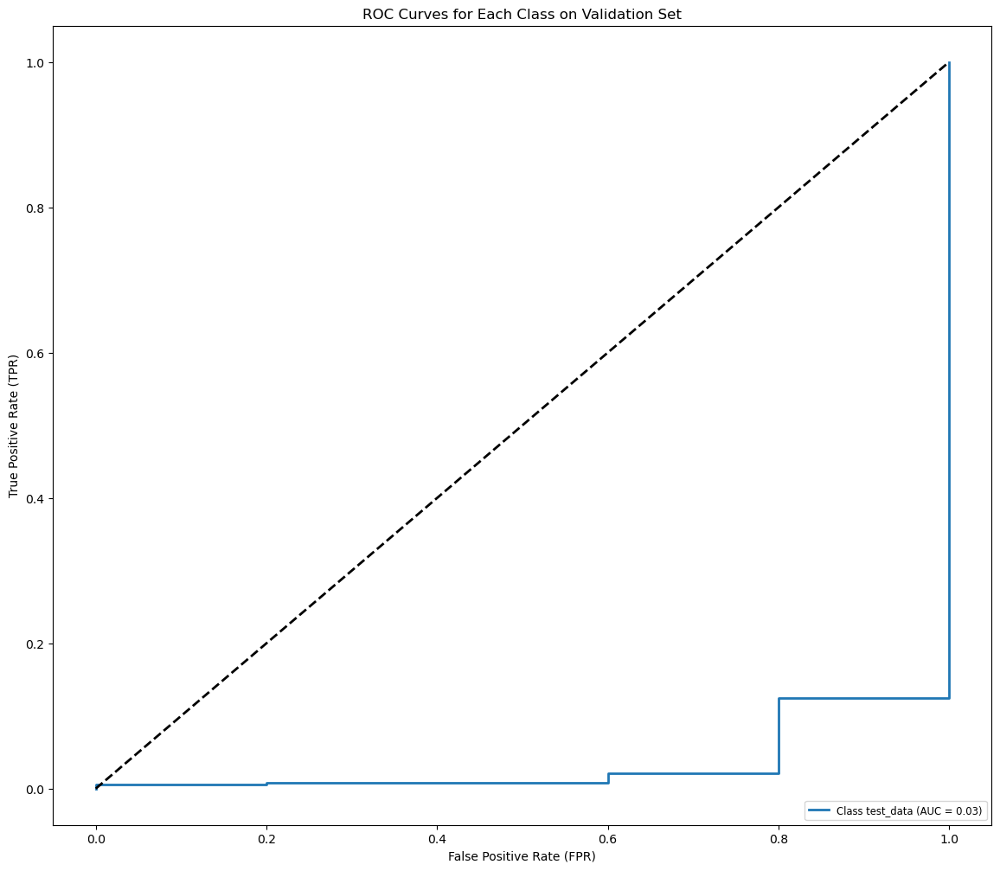

In [16]:
# === STEP 10: Evaluate model with confusion matrix, precision, recall, F1-score ===

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf
import os

# Step 10.1: Aggregate predictions and true labels from validation dataset
y_true = []
y_pred = []
y_scores = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_scores.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_scores = np.array(y_scores)

# Step 10.2: Confusion Matrix Plot
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

plt.figure(figsize=(12,12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix on Validation Set')
plt.show()

# Step 10.3: Precision, Recall, F1-score (weighted average)
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'
)
print(f"Weighted Precision: {precision:.4f}")
print(f"Weighted Recall:    {recall:.4f}")
print(f"Weighted F1-score:  {f1:.4f}")

# Step 10.4: Multi-class ROC curves and AUC

# Binarize the labels for multi-class ROC
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'Class {class_names[i]} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curves for Each Class on Validation Set")
plt.legend(loc="lower right", fontsize='small')
plt.show()



This step makes sure that the test_data folder has files, it then loads and processes them and then runs inferences on them.

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Original Image: CPH-Leuctra sp.-1910-t.png --> Predicted: train_data (99.64%)


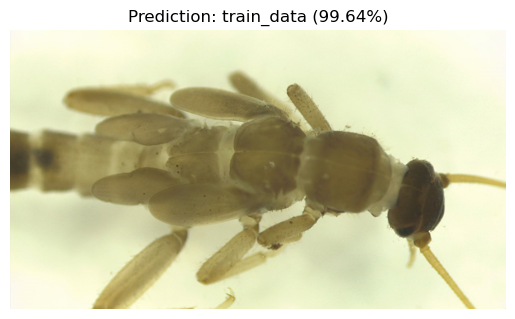

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Original Image: CPH-Leuctra sp.-1906-t.png --> Predicted: train_data (99.65%)


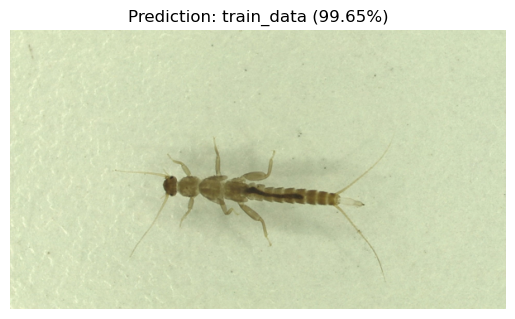

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Original Image: CPH-Leuctra sp.-1914-t.png --> Predicted: train_data (99.64%)


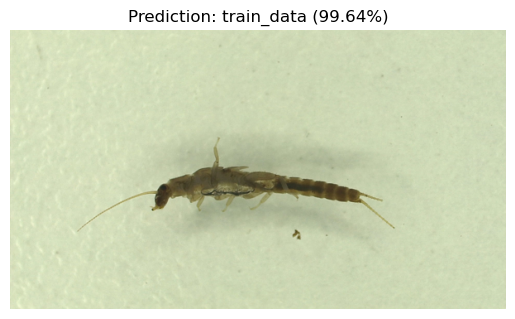

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Original Image: CPH-Limnius sp.-1923-t.png --> Predicted: train_data (99.62%)


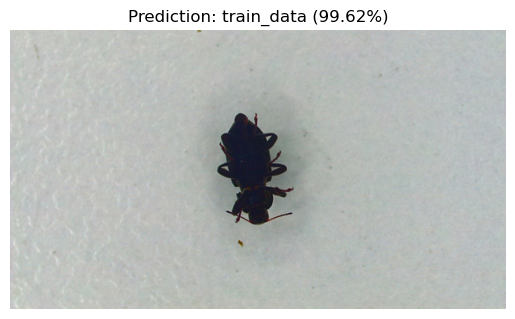

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Original Image: CPH-Leptophlebiidae sp.-1899-t.png --> Predicted: train_data (99.62%)


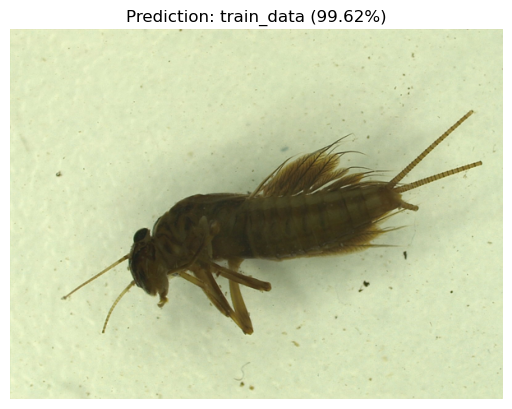

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Original Image: CPH-Leptophlebiidae sp.-1898-t.png --> Predicted: train_data (99.63%)


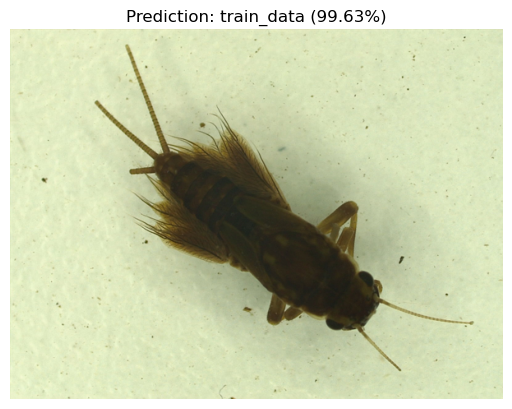

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Original Image: CPH-Leptophlebiidae sp.-1896-t.png --> Predicted: train_data (99.64%)


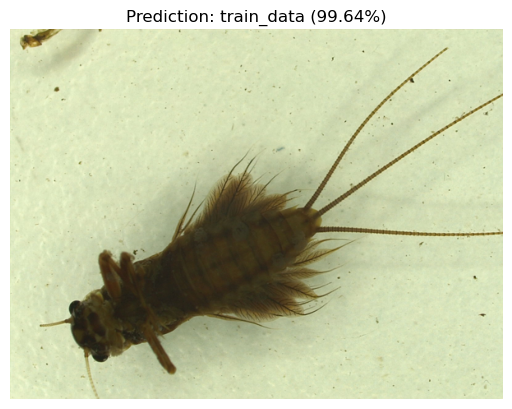

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Original Image: CPH-Limnius sp.-1927-t.png --> Predicted: train_data (99.60%)


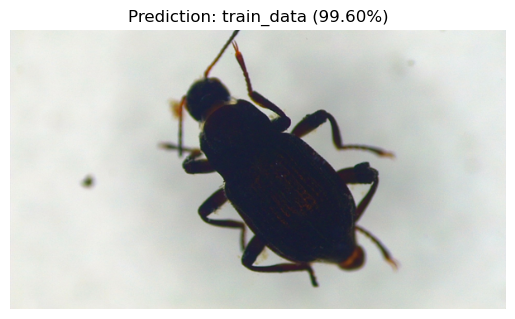

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Original Image: CPH-Leptophlebiidae sp.-1895-t.png --> Predicted: train_data (99.64%)


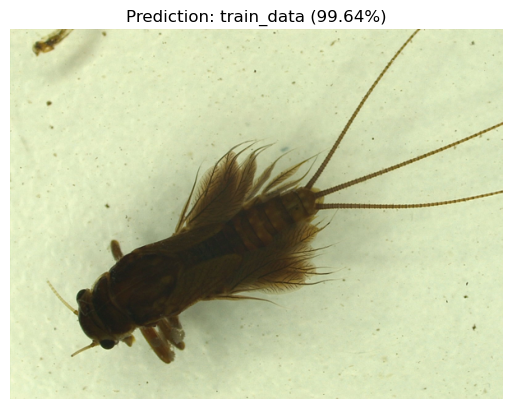

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Original Image: CPH-Leptophlebiidae sp.-1897-t.png --> Predicted: train_data (99.61%)


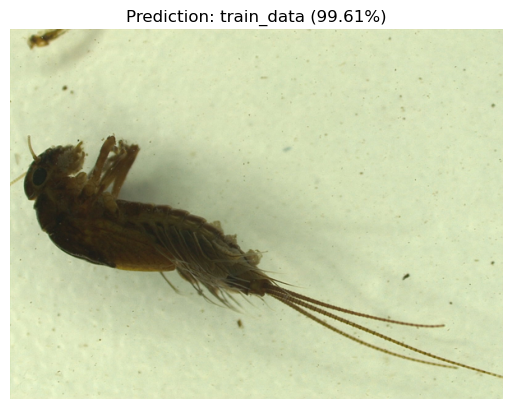

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Original Image: CPH-Leuctra sp.-1912-t.png --> Predicted: train_data (99.65%)


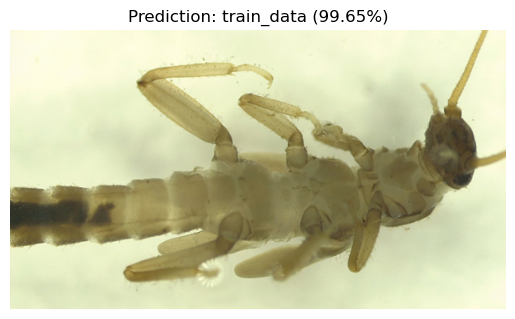

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Original Image: CPH-Limnius sp.-1929-t.png --> Predicted: train_data (99.57%)


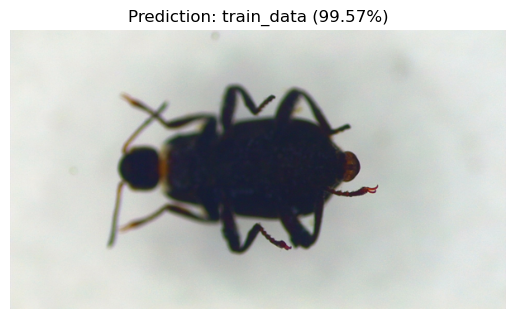

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Original Image: CPH-Limnius sp.-1925-t.png --> Predicted: train_data (99.56%)


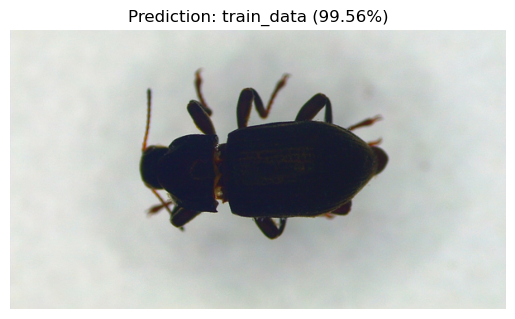

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Original Image: CPH-Limnius sp.-1924-t.png --> Predicted: train_data (99.58%)


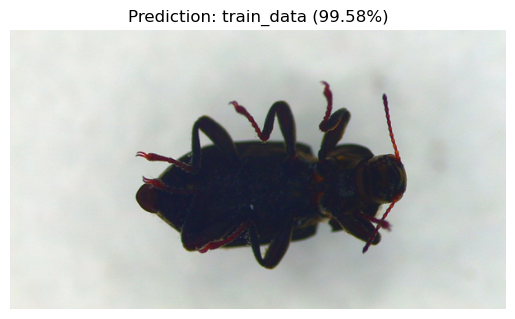

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Original Image: CPH-Leuctra sp.-1908-t.png --> Predicted: train_data (99.63%)


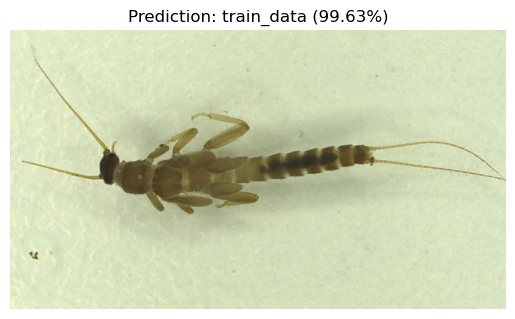

In [17]:
# === STEP 12: Inference on new images in 'test_images' folder ===

#TEST_IMAGE_DIR = 'test_images'
#TEST_IMAGE_DIR = '/content/drive/MyDrive/2026_Teaching/ST1/Week_7_Tut_Lab_Activities/Assets/insects_dataset/test_data'
TEST_IMAGE_DIR = './insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

def load_and_preprocess_image(img_path, img_size=IMG_SIZE):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)


# 2. EfficientNet Model

In [18]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np
import os

In [19]:
DATASET_DIR = './insects_dataset/'

In [20]:
IMG_SIZE = (224, 224)        # EfficientNetB0 default input size
BATCH_SIZE = 32
SEED = 123

This step loads the datasets with a roughly accurate training and validation split.
It also prints out the classes the datasets belong to.

In [21]:
# === STEP 1: Load dataset with 80/20 train-validation split ===

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print("Classes:", class_names)

Found 2664 files belonging to 2 classes.
Using 2132 files for training.
Found 2664 files belonging to 2 classes.
Using 532 files for validation.
Classes: ['test_data', 'train_data']


This step optimises the datasets for performance

In [22]:
# === STEP 2: Optimize dataset performance ===

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

This step manipulates the datasets by randomly rotating, flipping and zooming into the images.

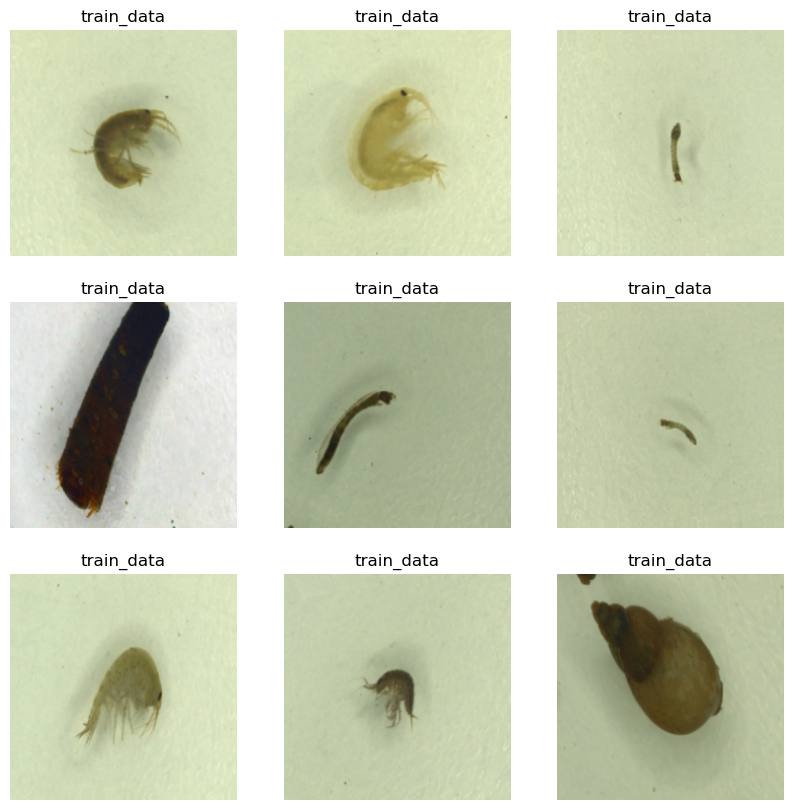

In [23]:
# === STEP 3: Data augmentation ===

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Optional: visualize augmented images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    augmented = data_augmentation(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(augmented[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()


This step trains a model with the EfficientNet80 model for transfer learning. It also preprocesses the inputs for the model.
It then compiles and prints out the models summary.

In [24]:
# === STEP 4: Build transfer learning model with EfficientNetB0 ===

base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # freeze base

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)               # apply augmentation
x = tf.keras.applications.efficientnet.preprocess_input(x)  # preprocess as EfficientNet expects
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)
model = models.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_2 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │         2,562 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,052,133 (15.46 MB)

 Trainable params: 2,562 (10.01 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

This step trains the model.

In [25]:
# === STEP 5: Train the model ===

EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 33s 415ms/step - accuracy: 0.9676 - loss: 0.0967 - val_accuracy: 0.9906 - val_loss: 0.0402
Epoch 2/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 27s 402ms/step - accuracy: 0.9953 - loss: 0.0271 - val_accuracy: 0.9906 - val_loss: 0.0357
Epoch 3/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 27s 398ms/step - accuracy: 0.9953 - loss: 0.0239 - val_accuracy: 0.9906 - val_loss: 0.0329
Epoch 4/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 27s 403ms/step - accuracy: 0.9953 - loss: 0.0221 - val_accuracy: 0.9906 - val_loss: 0.0306
Epoch 5/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 27s 405ms/step - accuracy: 0.9953 - loss: 0.0207 - val_accuracy: 0.9906 - val_loss: 0.0288
Epoch 6/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 27s 406ms/step - accuracy: 0.9953 - loss: 0.0208 - val_accuracy: 0.9906 - val_loss: 0.0280
Epoch 7/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 27s 404ms/step - accuracy: 0.9958 - loss: 0.0198 - val_accuracy: 0.9906 - val_loss: 0.0268
Epoch 8/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 27s 397ms/step - accuracy: 0.9953 - loss: 0.0174 - val_accu

This step shows 2 graphs showing the accuracy and value loss of the training and model data over the models training lifetime.

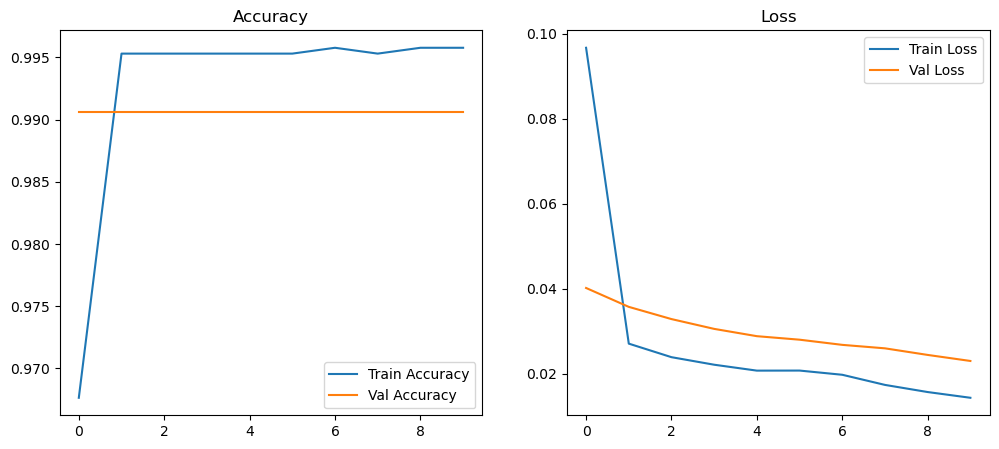

In [26]:
# === STEP 6: Plot training curves ===

acc, val_acc = history.history['accuracy'], history.history['val_accuracy']
loss, val_loss = history.history['loss'], history.history['val_loss']

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.title('Loss')

plt.show()

This step tunes the base model more finely for better performance. It then recompiles the new model, and redoes the plots from the last step for the new model.

Epoch 10/20
67/67 ━━━━━━━━━━━━━━━━━━━━ 66s 794ms/step - accuracy: 0.6027 - loss: 0.7449 - val_accuracy: 0.9906 - val_loss: 0.0335
Epoch 11/20
67/67 ━━━━━━━━━━━━━━━━━━━━ 52s 773ms/step - accuracy: 0.9240 - loss: 0.2556 - val_accuracy: 0.9906 - val_loss: 0.0411
Epoch 12/20
67/67 ━━━━━━━━━━━━━━━━━━━━ 51s 756ms/step - accuracy: 0.9906 - loss: 0.1126 - val_accuracy: 0.9906 - val_loss: 0.0450
Epoch 13/20
67/67 ━━━━━━━━━━━━━━━━━━━━ 50s 747ms/step - accuracy: 0.9948 - loss: 0.0637 - val_accuracy: 0.9906 - val_loss: 0.0453
Epoch 14/20
67/67 ━━━━━━━━━━━━━━━━━━━━ 51s 768ms/step - accuracy: 0.9953 - loss: 0.0439 - val_accuracy: 0.9906 - val_loss: 0.0444
Epoch 15/20
67/67 ━━━━━━━━━━━━━━━━━━━━ 51s 764ms/step - accuracy: 0.9953 - loss: 0.0373 - val_accuracy: 0.9906 - val_loss: 0.0435
Epoch 16/20
67/67 ━━━━━━━━━━━━━━━━━━━━ 51s 760ms/step - accuracy: 0.9953 - loss: 0.0316 - val_accuracy: 0.9906 - val_loss: 0.0425
Epoch 17/20
67/67 ━━━━━━━━━━━━━━━━━━━━ 52s 780ms/step - accuracy: 0.9953 - loss: 0.0307 - 

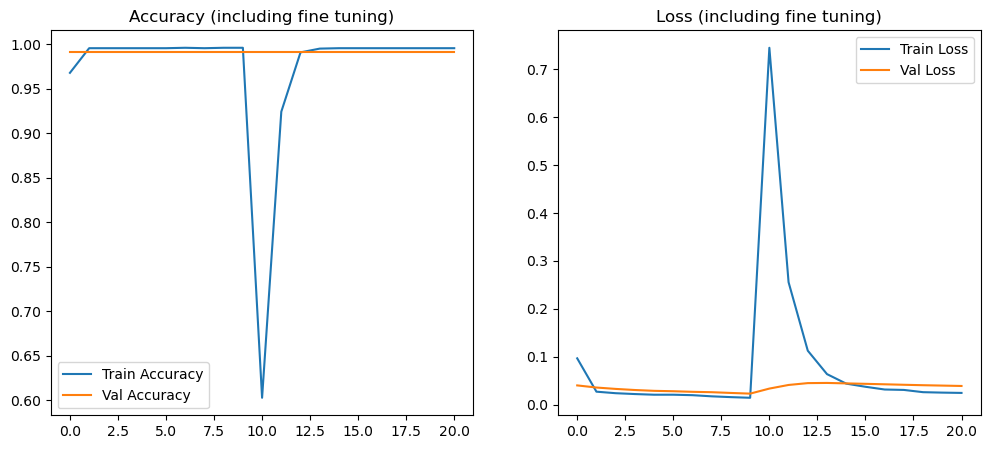

In [27]:
# === STEP 7 (Optional): Fine-tune base model ===

base_model.trainable = True

# Freeze initial layers, train last layers of EfficientNet
fine_tune_at = 100  # Freeze all layers before this
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

fine_tune_epochs = 10
total_epochs = EPOCHS + fine_tune_epochs

history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=total_epochs,
    initial_epoch=history.epoch[-1]
)

# Plot fine-tuning results (optional)
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']
loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.legend()
plt.title('Accuracy (including fine tuning)')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.title('Loss (including fine tuning)')

plt.show()

This step runs some predictions on new images and shows their accuracy.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


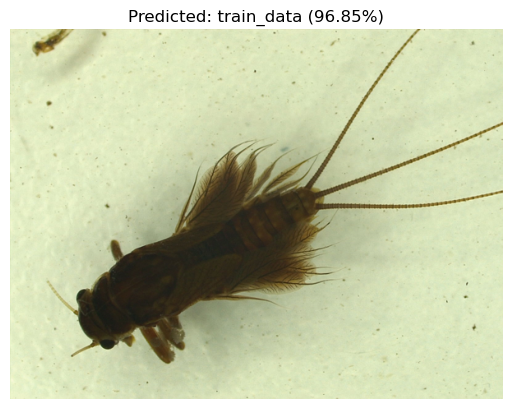

In [28]:
# === STEP 8: Prediction on new images ===

from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)
    return img_array

def predict_image(img_path, model, class_names):
    img_array = load_and_preprocess_image(img_path)
    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx]
    return class_names[pred_idx], confidence

# Example usage:
test_img_path = './insects_dataset/test_data/CPH-Leptophlebiidae sp.-1895-t.png'  # replace with your test image path
predicted_class, confidence = predict_image(test_img_path, model, class_names)

plt.imshow(image.load_img(test_img_path))
plt.title(f'Predicted: {predicted_class} ({confidence * 100:.2f}%)')
plt.axis('off')
plt.show()

This step makes some confusion matrices graphs and shows us the Precision, Recall and F1 Scores. As well as a graph showcasing the false positive and true positives rates across the guesses. \
NOTE: This one keeps erroring on both this notebook, as well as running it directly from the week8 notebook in this directory, with 2 different errors.


In [29]:
'''
Week8 notebook error is: 
ValueError                                Traceback (most recent call last)
Cell In[18], line 30
     28 disp = ConfusionMatrixDisplay(confusion_matrix=cm, \ display_labels=class_names) \
     29 plt.figure(figsize=(12, 12)) 
---> 30 disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical') 
     31 plt.title('Confusion Matrix') 
     32 plt.show() 
... some other stuff 
ValueError: The number of FixedLocator locations (16), usually from a call to set_ticks, does not match the number of labels (17).
This reports notebook error is: IndexError                                Traceback (most recent call last)
Cell In[48], line 52
     50 plt.figure(figsize=(14, 12))
     51 for i in range(n_classes):
---> 52     fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
     53     roc_auc[i] = auc(fpr[i], tpr[i])
     54     plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

IndexError: index 1 is out of bounds for axis 1 with size 1
'''

<>:5: SyntaxWarning: invalid escape sequence '\ '
<>:5: SyntaxWarning: invalid escape sequence '\ '
/tmp/ipykernel_726175/201328346.py:5: SyntaxWarning: invalid escape sequence '\ '
  28 disp = ConfusionMatrixDisplay(confusion_matrix=cm, \ display_labels=class_names) \


"\nWeek8 notebook error is: \nValueError                                Traceback (most recent call last)\nCell In[18], line 30\n     28 disp = ConfusionMatrixDisplay(confusion_matrix=cm, \\ display_labels=class_names)      29 plt.figure(figsize=(12, 12)) \n---> 30 disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical') \n     31 plt.title('Confusion Matrix') \n     32 plt.show() \n... some other stuff \nValueError: The number of FixedLocator locations (16), usually from a call to set_ticks, does not match the number of labels (17).\nThis reports notebook error is: IndexError                                Traceback (most recent call last)\nCell In[48], line 52\n     50 plt.figure(figsize=(14, 12))\n     51 for i in range(n_classes):\n---> 52     fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])\n     53     roc_auc[i] = auc(fpr[i], tpr[i])\n     54     plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')\n\nIndexError: index 1 is out of boun

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


<Figure size 1200x1200 with 0 Axes>

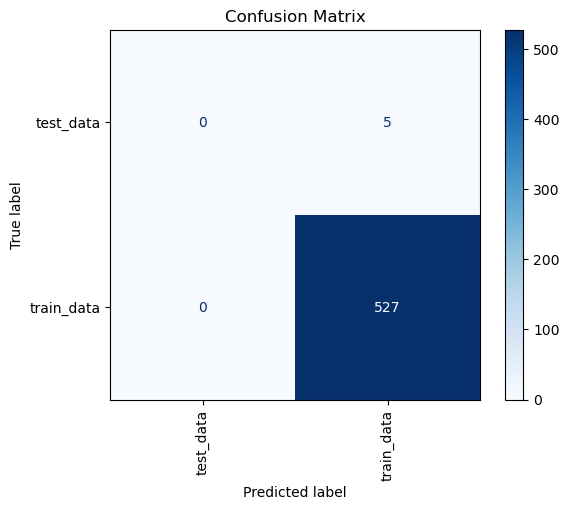

Precision: 0.9813
Recall:    0.9906
F1-score:  0.9859


/nix/store/vi9ql32cvmhq73h8zn05lab3pz3c7fsd-python3-3.13.12-env/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


IndexError: index 1 is out of bounds for axis 1 with size 1

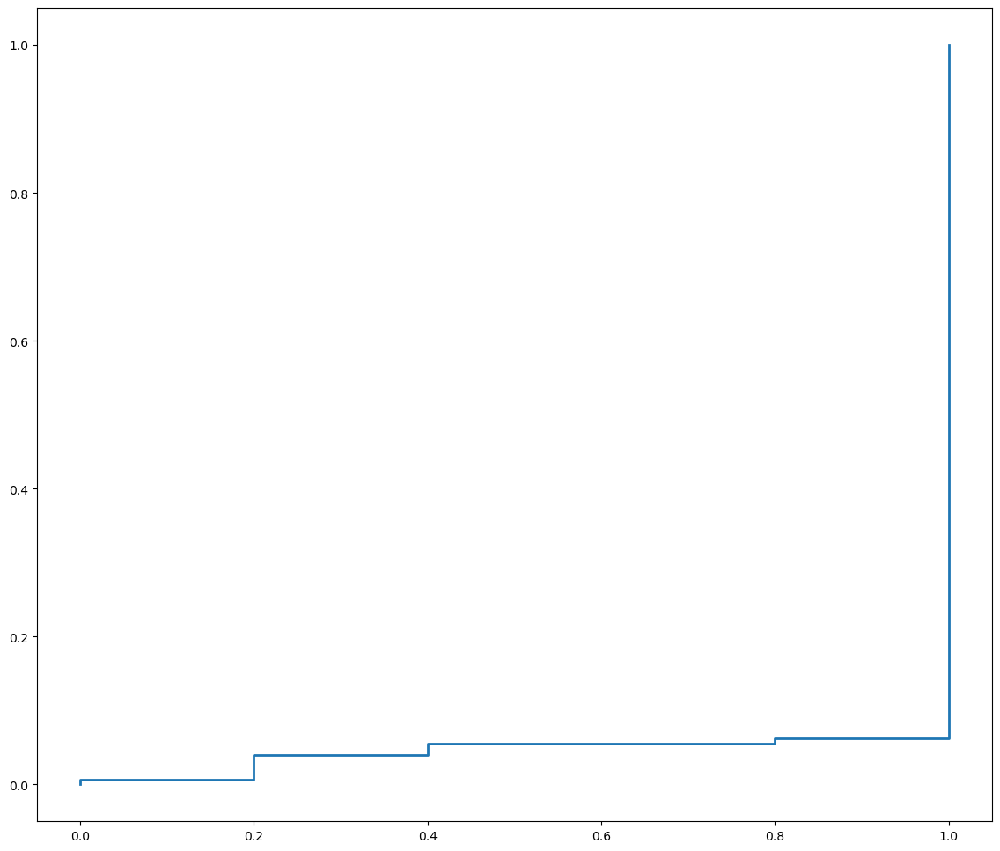

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf

# Aggregate true labels and predictions from validation dataset
y_true = []
y_pred = []
y_score = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(12, 12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall and F1-score
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'  # options: 'micro', 'macro', None...
)
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

# ROC Curve and AUC for multi-class
n_classes = len(class_names)
y_true_bin = label_binarize(y_true, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves per Class')
plt.legend(loc='lower right', fontsize='small')
plt.show()


This step runs some inferences on the test_images folder.

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
Original Image: CPH-Leuctra sp.-1910-t.png --> Predicted: train_data (87.83%)


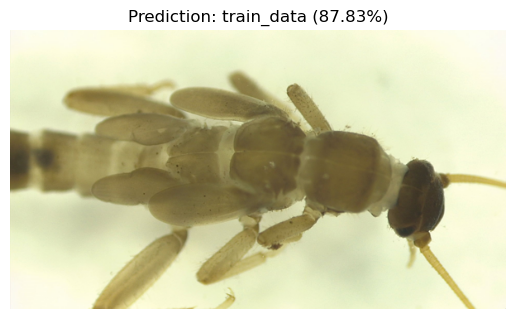

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
Original Image: CPH-Leuctra sp.-1906-t.png --> Predicted: train_data (87.77%)


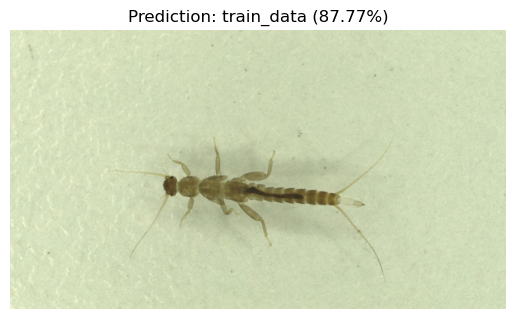

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Original Image: CPH-Leuctra sp.-1914-t.png --> Predicted: train_data (87.78%)


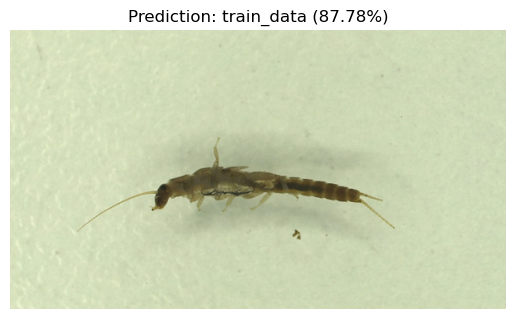

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Original Image: CPH-Limnius sp.-1923-t.png --> Predicted: train_data (87.82%)


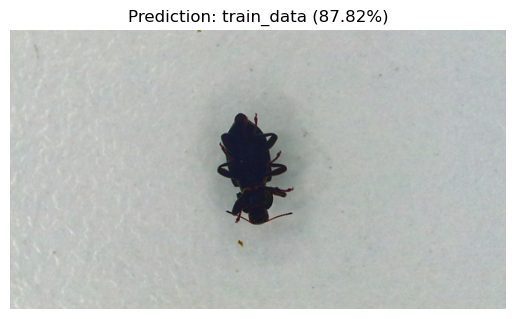

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Original Image: CPH-Leptophlebiidae sp.-1899-t.png --> Predicted: train_data (87.82%)


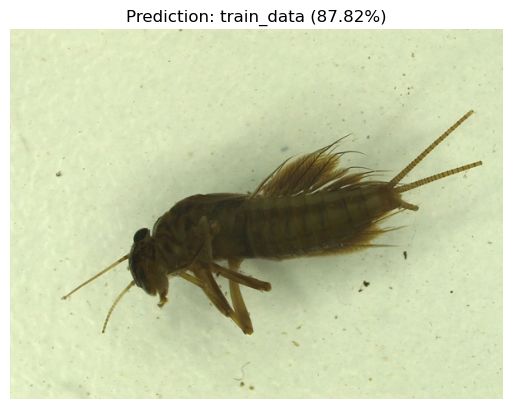

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Original Image: CPH-Leptophlebiidae sp.-1898-t.png --> Predicted: train_data (87.81%)


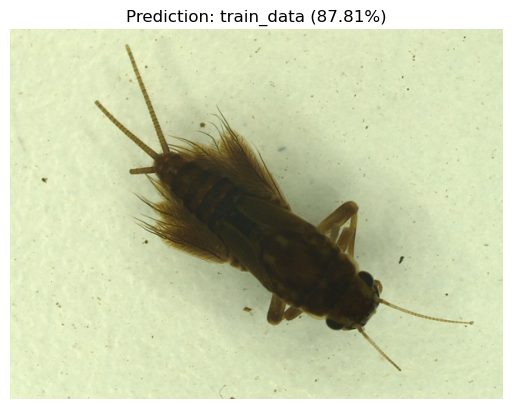

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Original Image: CPH-Leptophlebiidae sp.-1896-t.png --> Predicted: train_data (87.84%)


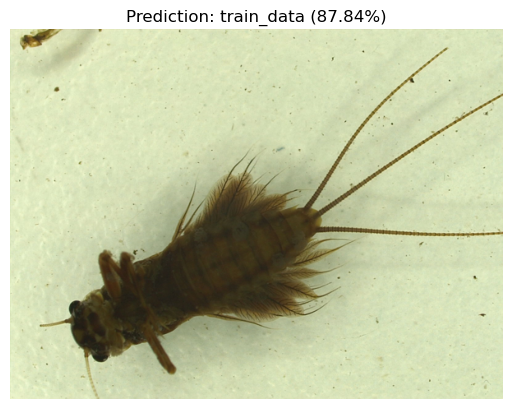

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Original Image: CPH-Limnius sp.-1927-t.png --> Predicted: train_data (87.90%)


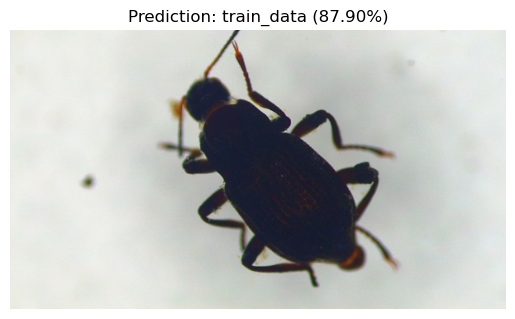

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Original Image: CPH-Leptophlebiidae sp.-1895-t.png --> Predicted: train_data (87.83%)


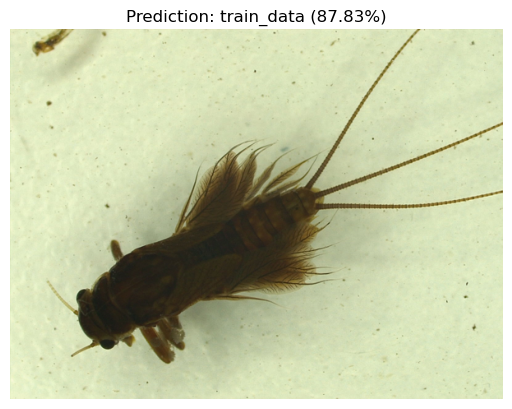

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Original Image: CPH-Leptophlebiidae sp.-1897-t.png --> Predicted: train_data (87.81%)


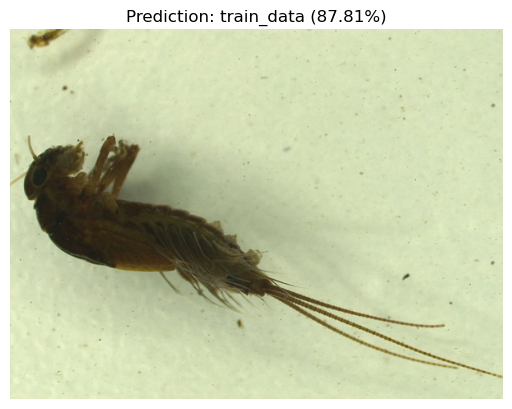

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Original Image: CPH-Leuctra sp.-1912-t.png --> Predicted: train_data (87.83%)


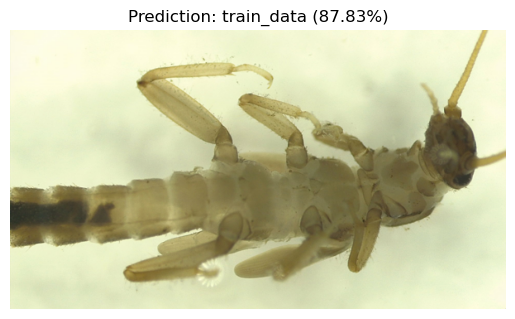

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Original Image: CPH-Limnius sp.-1929-t.png --> Predicted: train_data (87.88%)


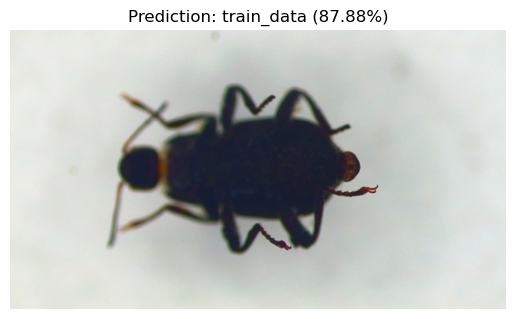

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Original Image: CPH-Limnius sp.-1925-t.png --> Predicted: train_data (87.88%)


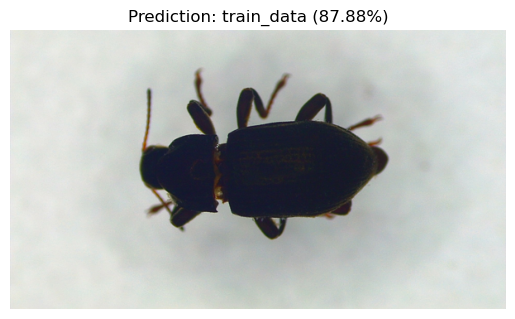

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Original Image: CPH-Limnius sp.-1924-t.png --> Predicted: train_data (87.89%)


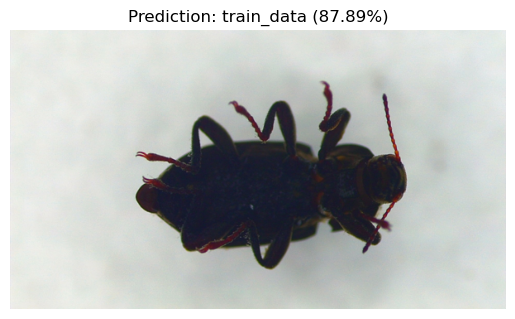

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Original Image: CPH-Leuctra sp.-1908-t.png --> Predicted: train_data (87.78%)


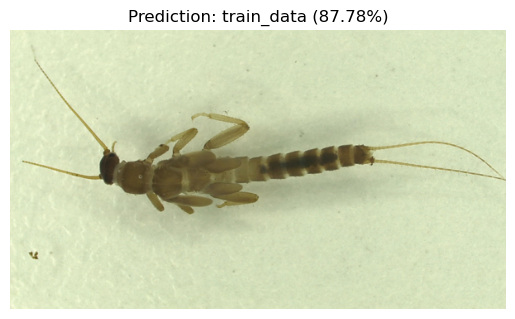

In [31]:
# === STEP 12: Inference on new images in 'test_images' folder ===

#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = 'insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

def load_and_preprocess_image(img_path, img_size=IMG_SIZE):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)


# 3. Vision Transformer Model

In [32]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import os

In [33]:
# === User parameters ===
DATASET_DIR = './insects_dataset/train_data/'  # Your insect dataset folder organized by classes
IMG_SIZE = 224            # ViT input size
BATCH_SIZE = 32
SEED = 123
EPOCHS = 10

This step loads the datasets with a roughly accurate training and validation split.
It also prints out the classes the datasets belong to.

In [34]:

# === Step 1: Load Dataset with 80/20 split ===

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset='training',
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset='validation',
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Classes: {class_names}")

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)


Found 2649 files belonging to 17 classes.
Using 2120 files for training.
Found 2649 files belonging to 17 classes.
Using 529 files for validation.
Classes: ['Asellus sp', 'Baetidae sp', 'Elmis sp', 'Ephemerellidae', 'Erpobdella sp', 'Gammarus sp', 'Hydropsychidae sp', 'Leptophlebiidae sp', 'Leuctra sp', 'Limnius sp', 'Lymnea sp', 'Nemoura sp', 'Oligochaeta sp', 'Sericostomatidae sp', 'Sialis sp', 'Simuliidae sp', 'Sphaerium sp']


This step randomly rotates, zooms into and flips the images horizontally. 

In [35]:
# === Step 2: Data augmentation ===

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

This loads the ViT Feature Extractor.

In [36]:
# === Step 3: Load ViT Feature Extractor from TF Hub ===

vit_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_layer = hub.KerasLayer(vit_url, trainable=False)

This step augments the data and uses the ViT feature extractor. \
It then compiles the model down with these changes.

In [37]:
#====Step 4:
inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# Data augmentation
x = data_augmentation(inputs)

# The TF Hub ViT module expects pixel values in [0, 255].
# image_dataset_from_directory typically outputs float32 in [0, 255],
# and data_augmentation maintains this. So, no explicit [0,1] scaling is needed here.

# ViT feature extractor
# Wrap the vit_layer call in a Lambda layer to ensure proper symbolic tensor handling
features = tf.keras.layers.Lambda(lambda y: vit_layer(y))(x);

# Classification head
outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(features)

model = tf.keras.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

This step trains the model.

In [38]:

# === Step 5: Train the model ===

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
)

Epoch 1/10


I0000 00:00:1775803424.890161  726819 service.cc:153] XLA service 0x7f13b4864280 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1775803424.890206  726819 service.cc:161]   StreamExecutor [0]: Host, Default Version (Driver: 0.0.0; Runtime: 0.0.0; Toolkit: 0.0.0; DNN: 0.0.0)
I0000 00:00:1775803424.975488  726819 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1775803425.623878  726819 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


67/67 ━━━━━━━━━━━━━━━━━━━━ 221s 3s/step - accuracy: 0.4146 - loss: 2.1205 - val_accuracy: 0.4915 - val_loss: 1.6485
Epoch 2/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 213s 3s/step - accuracy: 0.5085 - loss: 1.5934 - val_accuracy: 0.5690 - val_loss: 1.4889
Epoch 3/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 214s 3s/step - accuracy: 0.5491 - loss: 1.4696 - val_accuracy: 0.6219 - val_loss: 1.3249
Epoch 4/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 208s 3s/step - accuracy: 0.5807 - loss: 1.3618 - val_accuracy: 0.6333 - val_loss: 1.2794
Epoch 5/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 199s 3s/step - accuracy: 0.6113 - loss: 1.2940 - val_accuracy: 0.6597 - val_loss: 1.2360
Epoch 6/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 198s 3s/step - accuracy: 0.6250 - loss: 1.2553 - val_accuracy: 0.6465 - val_loss: 1.1819
Epoch 7/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 198s 3s/step - accuracy: 0.6193 - loss: 1.2196 - val_accuracy: 0.6541 - val_loss: 1.1515
Epoch 8/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 198s 3s/step - accuracy: 0.6528 - loss: 1.1672 - val_accuracy: 0.6824 - val_loss: 1.

This step creates 2 graphs for the validation accuracy and loss values of the model.

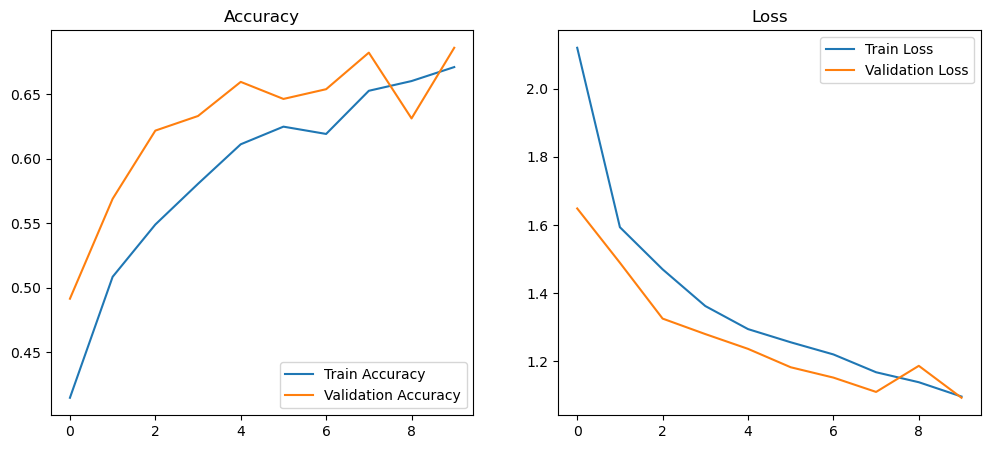

In [39]:
# === Step 6: Plot training & validation accuracy/loss ===

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')

plt.show()


This step does some preprocessing and sets up the ability to predict images better.

In [40]:
# === Step 7: Prediction helper function ===

def load_and_preprocess_image(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    return img_array

def predict_image(img_path, model, class_names):
    img_array = load_and_preprocess_image(img_path)
    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx]
    return class_names[pred_idx], confidence


This shows an example prediction setup and what the image it makes should look like.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


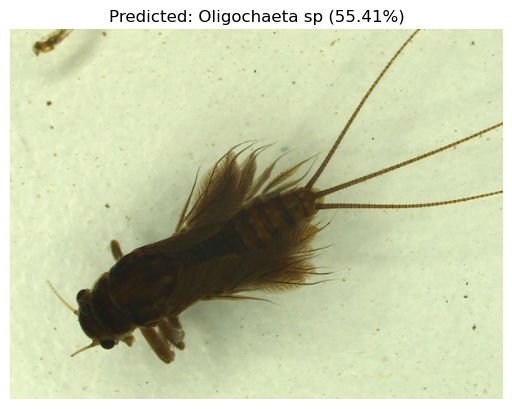

In [41]:
# === Example prediction ===
test_img_path = './insects_dataset/test_data/CPH-Leptophlebiidae sp.-1895-t.png'  # Replace with your image path

predicted_class, confidence = predict_image(test_img_path, model, class_names)

plt.imshow(tf.keras.preprocessing.image.load_img(test_img_path))
plt.title(f'Predicted: {predicted_class} ({confidence*100:.2f}%)')
plt.axis('off')
plt.show()

This step makes the confusion matrix, and shows the Precision, Recall and F1-Score score values. It also makes a graph showcasing the True Positive Rate and the False Positive Rate of the model.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


<Figure size 1200x1200 with 0 Axes>

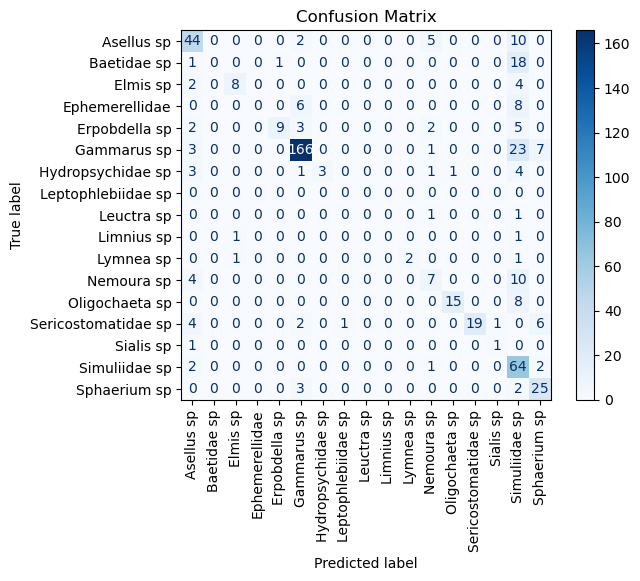

Precision: 0.7173
Recall:    0.6862
F1-score:  0.6715


/nix/store/vi9ql32cvmhq73h8zn05lab3pz3c7fsd-python3-3.13.12-env/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/nix/store/vi9ql32cvmhq73h8zn05lab3pz3c7fsd-python3-3.13.12-env/lib/python3.13/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/nix/store/vi9ql32cvmhq73h8zn05lab3pz3c7fsd-python3-3.13.12-env/lib/python3.13/site-packages/sklearn/metrics/_ranking.py:1303: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


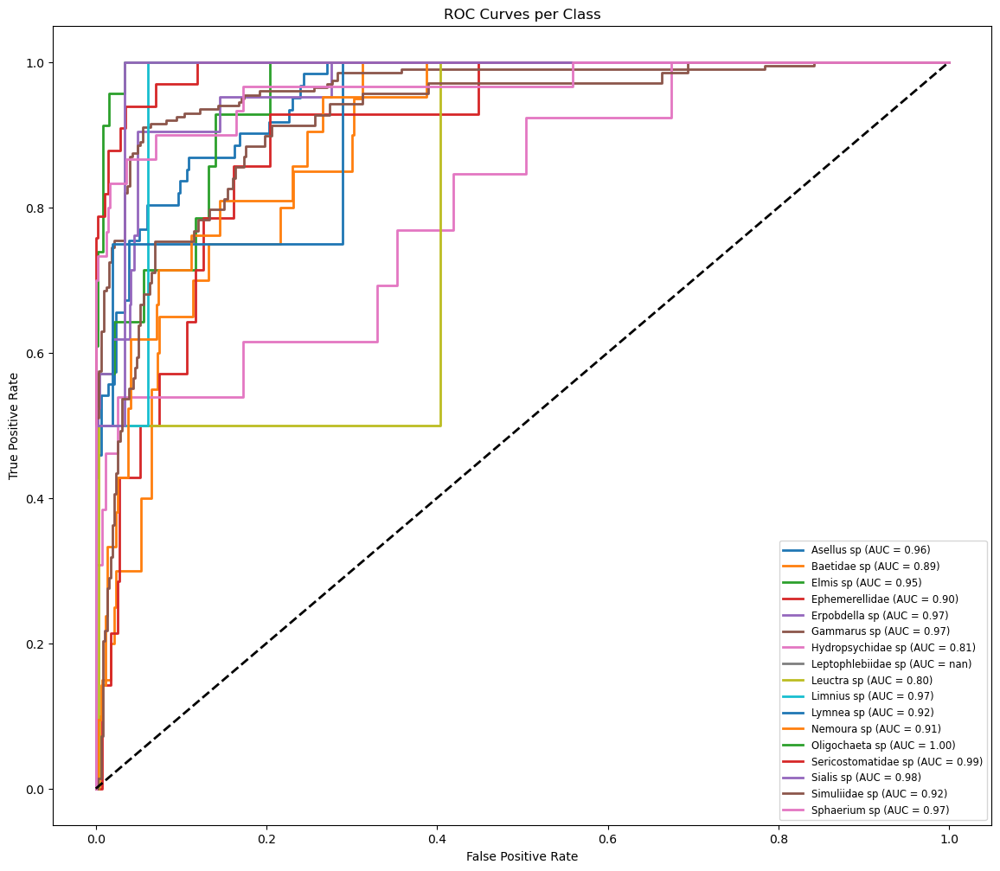

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf

# Aggregate true labels and predictions from validation dataset
y_true = []
y_pred = []
y_score = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(12, 12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall and F1-score
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'  # options: 'micro', 'macro', None...
)
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

# ROC Curve and AUC for multi-class
n_classes = len(class_names)
y_true_bin = label_binarize(y_true, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves per Class')
plt.legend(loc='lower right', fontsize='small')
plt.show()


This step shows the inferences of this model on the test image and their accuracy.

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Original Image: CPH-Leuctra sp.-1910-t.png --> Predicted: Sericostomatidae sp (25.48%)


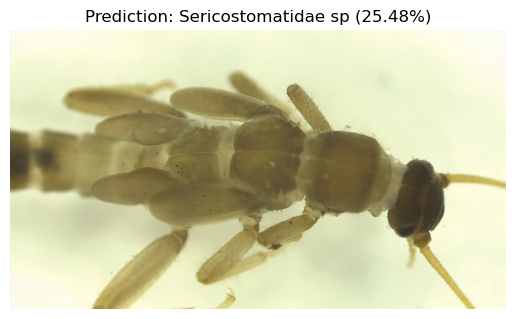

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
Original Image: CPH-Leuctra sp.-1906-t.png --> Predicted: Nemoura sp (61.74%)


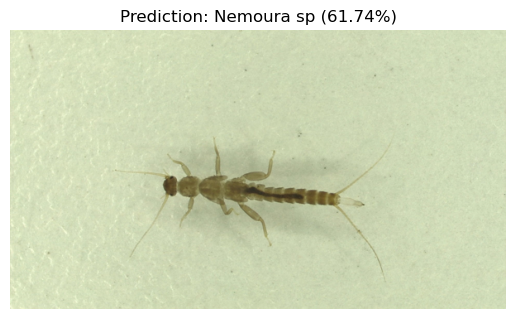

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Original Image: CPH-Leuctra sp.-1914-t.png --> Predicted: Asellus sp (36.56%)


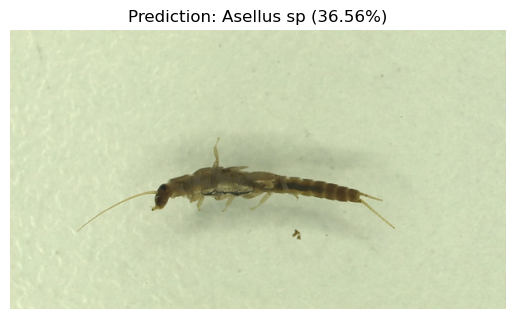

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Original Image: CPH-Limnius sp.-1923-t.png --> Predicted: Asellus sp (93.67%)


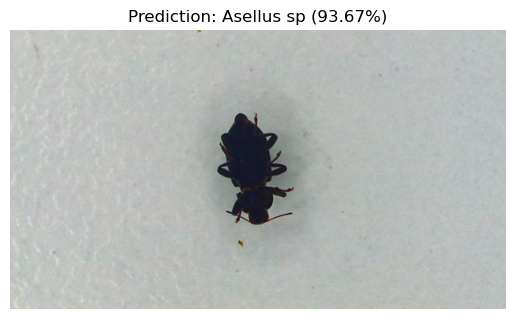

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
Original Image: CPH-Leptophlebiidae sp.-1899-t.png --> Predicted: Baetidae sp (55.44%)


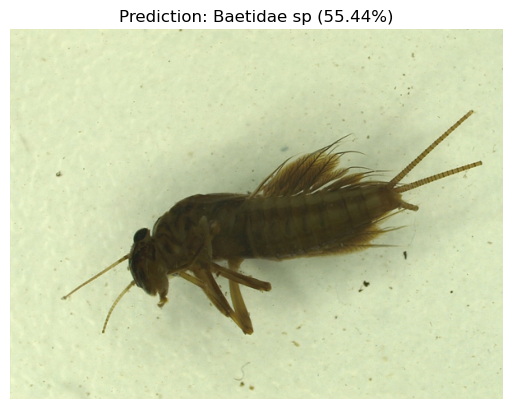

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
Original Image: CPH-Leptophlebiidae sp.-1898-t.png --> Predicted: Baetidae sp (28.21%)


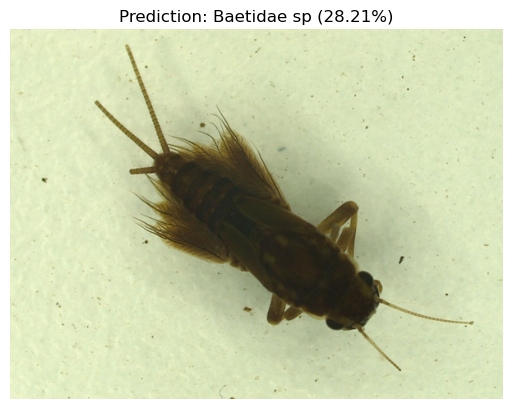

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Original Image: CPH-Leptophlebiidae sp.-1896-t.png --> Predicted: Sericostomatidae sp (29.78%)


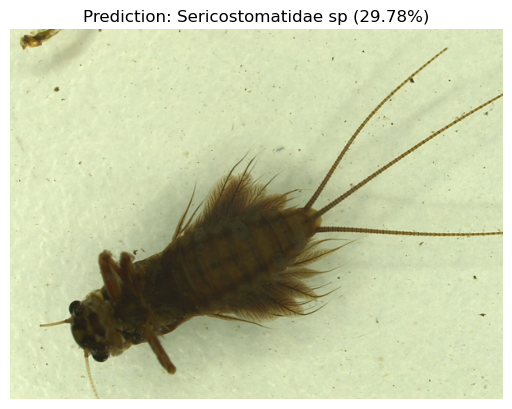

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
Original Image: CPH-Limnius sp.-1927-t.png --> Predicted: Asellus sp (51.33%)


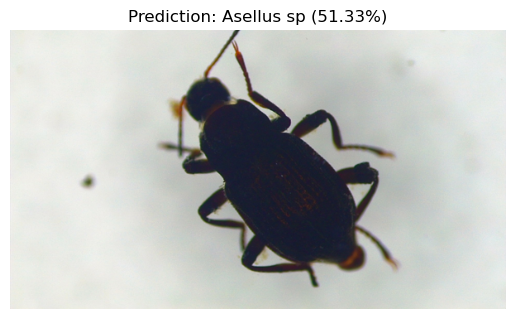

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
Original Image: CPH-Leptophlebiidae sp.-1895-t.png --> Predicted: Oligochaeta sp (55.41%)


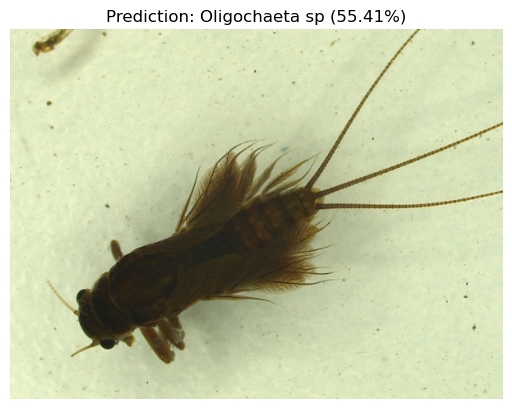

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
Original Image: CPH-Leptophlebiidae sp.-1897-t.png --> Predicted: Oligochaeta sp (77.27%)


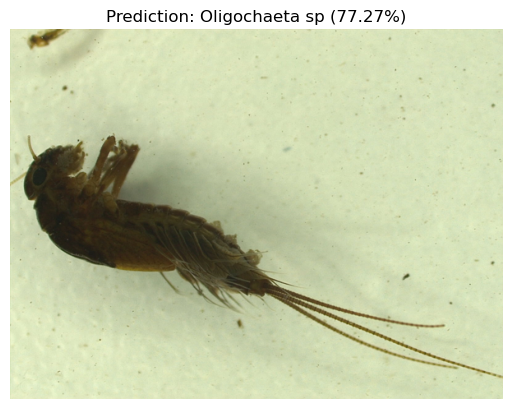

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
Original Image: CPH-Leuctra sp.-1912-t.png --> Predicted: Leptophlebiidae sp (38.90%)


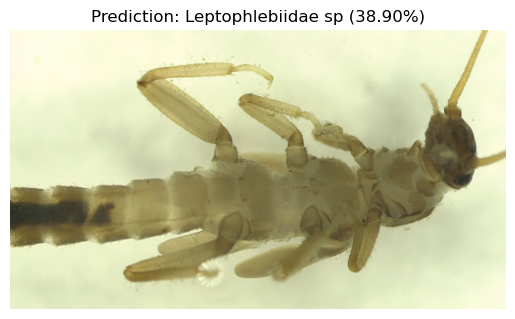

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Original Image: CPH-Limnius sp.-1929-t.png --> Predicted: Asellus sp (87.92%)


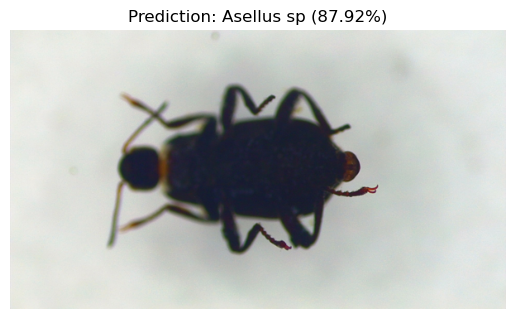

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
Original Image: CPH-Limnius sp.-1925-t.png --> Predicted: Asellus sp (65.09%)


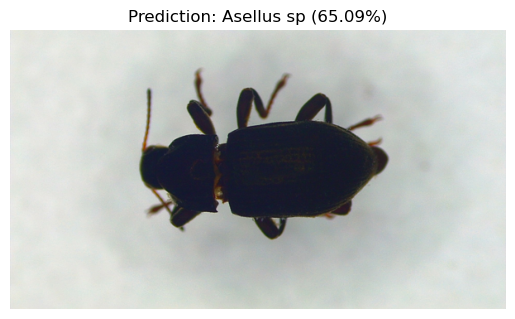

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
Original Image: CPH-Limnius sp.-1924-t.png --> Predicted: Sericostomatidae sp (78.67%)


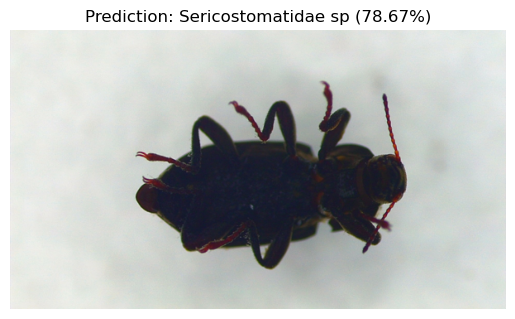

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
Original Image: CPH-Leuctra sp.-1908-t.png --> Predicted: Baetidae sp (54.96%)


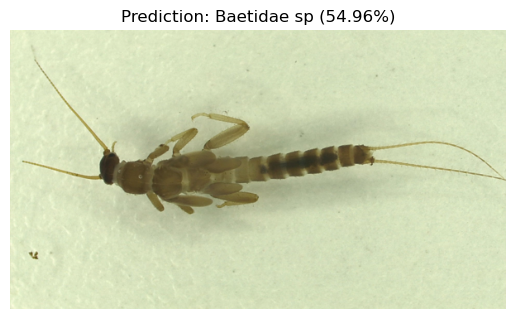

In [44]:
# === STEP 12: Inference on new images in 'test_images' folder ===

TEST_IMAGE_DIR = './insects_dataset/test_data'
#TEST_IMAGE_DIR = '/content/drive/MyDrive/2026_Teaching/ST1/Week_7_Tut_Lab_Activities/Assets/insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

# Ensure IMG_SIZE is treated as a tuple for this function
_target_img_size = (IMG_SIZE, IMG_SIZE) if not isinstance(IMG_SIZE, tuple) else IMG_SIZE

def load_and_preprocess_image(img_path, img_size=_target_img_size):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)
